In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import plotly.express as px
from datetime import datetime
import seaborn as sns

In [3]:
from pylab import rcParams
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import scale
from sklearn import metrics
from sklearn import datasets
from sklearn.datasets import load_boston

In [7]:
# import pip
#pip.main(["install", "openpyxl"])

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Collecting openpyxl

Using cached openpyxl-3.1.1-py2.py3-none-any.whl (249 kB)

Collecting et-xmlfile

Using cached et_xmlfile-1.1.0-py3-none-any.whl (4.7 kB)

Installing collected packages: et-xmlfile, openpyxl

Successfully installed et-xmlfile-1.1.0 openpyxl-3.1.1

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip

0

In [76]:
s_aut = pd.read_excel('15% uzywane manualna.xlsx')
s_man = pd.read_excel('20% uzywane automatyczna.xlsx')
s_man.head(3)

,e1b25f6f6,e1b25f6f6 href,e1b25f6f12,ooa-1k7nwcr,ooa-1k7nwcr 2,ooa-1k7nwcr 3,ooa-1k7nwcr 4,ooa-l5u4as href,ooa-fzu03x,ooa-0,...,ooa-1dwk0yu href,eploibe0,fin_link_list_span_1,fin_link_list_span_1 2,fin_link_list_a,fin_link_list_a href,ooa-1ohf0ui,ooa-16xi4ja href,ooa-a837x4 src,e1b25f6f20
0,Mercedes-Benz GLC 220 d 4-Matic,https://www.otomoto.pl/oferta/mercedes-benz-gl...,Mercedes Benz GLC Pakiet AMG full opcja,2019,105 000 km,1 950 cm3,Diesel,[object Object],Hajnówka (Podlaskie),Opublikowano 4 minuty temu,...,[object Object],W granicach średniej,Już od 3542,PLN,Sprawdź możliwości finansowania,https://finansowanie.otomoto.pl/?&price=200490...,Obserwuj,NaN,NaN,NaN
1,Jaguar XF 3.0 V6 D S Luxury,https://www.otomoto.pl/oferta/jaguar-xf-jaguar...,Jaguar XF S Premium Luxury PORTFOLIO 3.0 V6 27...,2010,280 000 km,2 993 cm3,Diesel,[object Object],Bystrzyca (Lubelskie),Podbite 5 minut temu,...,[object Object],Powyżej średniej,Już od 848,PLN,Sprawdź możliwości finansowania,https://finansowanie.otomoto.pl/?&price=48000&...,Obserwuj,NaN,NaN,NaN
2,Audi A6 Avant 3.0 TDI DPF quattro S tronic,https://www.otomoto.pl/oferta/audi-a6-3-0-tdi-...,"3.0 TDI 245km Quattro S line Rotor 20"" S troni...",2013,368 000 km,2 967 cm3,Diesel,[object Object],Szprotawa (Lubuskie),Podbite 9 minut temu,...,[object Object],Powyżej średniej,Już od 1288,PLN,Sprawdź możliwości finansowania,https://finansowanie.otomoto.pl/?&price=72900&...,Obserwuj,NaN,NaN,NaN


In [77]:
s_man.head(3)

,e1b25f6f6,e1b25f6f6 href,e1b25f6f12,ooa-1k7nwcr,ooa-1k7nwcr 2,ooa-1k7nwcr 3,ooa-1k7nwcr 4,ooa-l5u4as href,ooa-fzu03x,ooa-0,...,ooa-1dwk0yu href,eploibe0,fin_link_list_span_1,fin_link_list_span_1 2,fin_link_list_a,fin_link_list_a href,ooa-1ohf0ui,ooa-16xi4ja href,ooa-a837x4 src,e1b25f6f20
0,Mercedes-Benz GLC 220 d 4-Matic,https://www.otomoto.pl/oferta/mercedes-benz-gl...,Mercedes Benz GLC Pakiet AMG full opcja,2019,105 000 km,1 950 cm3,Diesel,[object Object],Hajnówka (Podlaskie),Opublikowano 4 minuty temu,...,[object Object],W granicach średniej,Już od 3542,PLN,Sprawdź możliwości finansowania,https://finansowanie.otomoto.pl/?&price=200490...,Obserwuj,NaN,NaN,NaN
1,Jaguar XF 3.0 V6 D S Luxury,https://www.otomoto.pl/oferta/jaguar-xf-jaguar...,Jaguar XF S Premium Luxury PORTFOLIO 3.0 V6 27...,2010,280 000 km,2 993 cm3,Diesel,[object Object],Bystrzyca (Lubelskie),Podbite 5 minut temu,...,[object Object],Powyżej średniej,Już od 848,PLN,Sprawdź możliwości finansowania,https://finansowanie.otomoto.pl/?&price=48000&...,Obserwuj,NaN,NaN,NaN
2,Audi A6 Avant 3.0 TDI DPF quattro S tronic,https://www.otomoto.pl/oferta/audi-a6-3-0-tdi-...,"3.0 TDI 245km Quattro S line Rotor 20"" S troni...",2013,368 000 km,2 967 cm3,Diesel,[object Object],Szprotawa (Lubuskie),Podbite 9 minut temu,...,[object Object],Powyżej średniej,Już od 1288,PLN,Sprawdź możliwości finansowania,https://finansowanie.otomoto.pl/?&price=72900&...,Obserwuj,NaN,NaN,NaN


In [1]:
#drop column s_man
del s_man['ooa-1e56i1c']
del s_man['ooa-1dwk0yu href']
del s_man['eploibe0']
del s_man['fin_link_list_a']
del s_man['ooa-16xi4ja href']
del s_man['ooa-a837x4 src']
del s_man['e1b25f6f20']
del s_man['ooa-1ohf0ui']
del s_man['fin_link_list_span_1']
del s_man['ooa-0']
del s_man['ooa-l5u4as href']
del s_man['fin_link_list_a href']
del s_man['e1b25f6f18 src']


#drop column s_man
del s_aut['ooa-1e56i1c']
del s_aut['ooa-1dwk0yu href']
del s_aut['eploibe0']
del s_aut['fin_link_list_a']
del s_aut['ooa-16xi4ja href']
del s_aut['ooa-a837x4 src']
del s_aut['e1b25f6f20']
del s_aut['ooa-1ohf0ui']
del s_aut['fin_link_list_span_1']
del s_aut['ooa-0']
del s_aut['ooa-l5u4as href']
del s_aut['fin_link_list_a href']
del s_aut['e1b25f6f18 src']

#columns headers rename 

s_man.rename(columns={"e1b25f6f6":"Name" ,"e1b25f6f6 href":"Link" , "e1b25f6f12":"Description", 
                      "ooa-1k7nwcr":"Year", "ooa-1k7nwcr 2":"Mileage", "ooa-1k7nwcr 3":"Capacity",
                     "ooa-1k7nwcr 4":"Fuel", "ooa-fzu03x":"Location",
                     "ooa-1bmnxg7":"Price", "fin_link_list_span_1 2":"Currency" },inplace=True)

s_aut.rename(columns={"e1b25f6f6":"Name" ,"e1b25f6f6 href":"Link" , "e1b25f6f12":"Description", 
                      "ooa-1k7nwcr":"Year", "ooa-1k7nwcr 2":"Mileage", "ooa-1k7nwcr 3":"Capacity",
                     "ooa-1k7nwcr 4":"Fuel", "ooa-fzu03x":"Location",
                     "ooa-1bmnxg7":"Price", "fin_link_list_span_1 2":"Currency" },inplace=True)



In [2]:
#s_aut['Waluta'].isna().sum()
s_aut.isnull().sum()


Name             0
Link             0
Description    754
Year             0
Mileage          0
Capacity         0
Fuel             2
Location       148
Price            0
Currency       388
dtype: int64

In [3]:
#Usun z tabeli Cena "PLN" 
s_man['Price'] = s_man['Price'].str.replace('PLN', '')
s_man['Price'] = s_man['Price'].str.replace('EUR', '')
s_man['Price'] = s_man['Price'].str.replace(' ', '')
s_aut['Price'] = s_aut['Price'].str.replace('PLN', '')
s_aut['Price'] = s_aut['Price'].str.replace('EUR', '')
s_aut['Price'] = s_aut['Price'].str.replace(' ', '')

In [4]:
#Usun z tabeli Pojemnosc "cm3" 
s_man['Capacity'] = s_man['Capacity'].str.replace(' ', '')
s_man['Capacity'] = s_man['Capacity'].str.replace('cm3', '')
s_aut['Capacity'] = s_aut['Capacity'].str.replace(' ', '')
s_aut['Capacity'] = s_aut['Capacity'].str.replace('cm3', '')

#Usun z tabeli Przebieg "km" 
s_man['Mileage'] = s_man['Mileage'].str.replace('km', '')
s_man['Mileage'] = s_man['Mileage'].str.replace(' ', '')

s_aut['Mileage'] = s_aut['Mileage'].str.replace('km', '')
s_aut['Mileage'] = s_aut['Mileage'].str.replace(' ', '')


In [5]:
#unique data nunstackto find and remove
s_man['Currency'].unique()

array(['PLN', nan, 'EUR'], dtype=object)

In [6]:
#
s_man['Price'].value_counts()

69900     123
89900     110
59900     109
99900     104
79900     102
         ... 
65660       1
67700       1
275200      1
87800       1
469000      1
Name: Price, Length: 2628, dtype: int64

In [7]:
#Jak pokazac caly wicount gdzie brak dancyh dla konkretnej wartosci
s_aut[s_aut['Fuel'].isna()]

,Name,Link,Description,Year,Mileage,Capacity,Fuel,Location,Price,Currency
53,Toyota Corolla,https://www.otomoto.pl/oferta/toyota-corolla-t...,Toyota Corolla comfort/Vat 23%,2021,53768,Hybryda,NaN,Włocławek (Kujawsko-pomorskie),119900,PLN
103,Toyota Yaris,https://www.otomoto.pl/oferta/toyota-yaris-toy...,Toyota yaris premium city style/ Vat marża,2020,16294,Benzyna,NaN,Włocławek (Kujawsko-pomorskie),73900,PLN


In [11]:
#Usun caly wiersz jesli wartosci w wybrancyh kolumnach jest NA
s_aut.dropna(subset=['Price', 'Location', 'Fuel', 'Currency'] ,inplace=True)
s_man.dropna(subset=['Price', 'Location', 'Fuel', 'Currency'] ,inplace=True)



In [13]:
s_man.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 12655 entries, 0 to 13075
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         12655 non-null  object
 1   Link         12655 non-null  object
 2   Description  12072 non-null  object
 3   Year         12655 non-null  int64 
 4   Mileage      12655 non-null  int64 
 5   Capacity     12655 non-null  int64 
 6   Fuel         12655 non-null  object
 7   Location     12655 non-null  object
 8   Price        12655 non-null  object
 9   Currency     12655 non-null  object
dtypes: int64(3), object(7)
memory usage: 1.1+ MB


In [10]:
s_man['Capacity'] = s_man['Capacity'].astype('int64')
s_man['Mileage'] = s_man['Mileage'].astype('int64')
s_man['Currency'] = s_man['Currency'].astype('int64')


ValueError: invalid literal for int() with base 10: 'PLN'

In [125]:
s_man[s_man['Price']=='PLN']

,Name,Link,Description,Year,Mileage,Capacity,Fuel,Location,Price,Currency


In [14]:
s_man['Price'] = s_man['Price'].astype('int64')

/Users/marcin/Applications/Link.app/Contents/Resources/mrx-link-venv/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<AxesSubplot:xlabel='Capacity', ylabel='Density'>

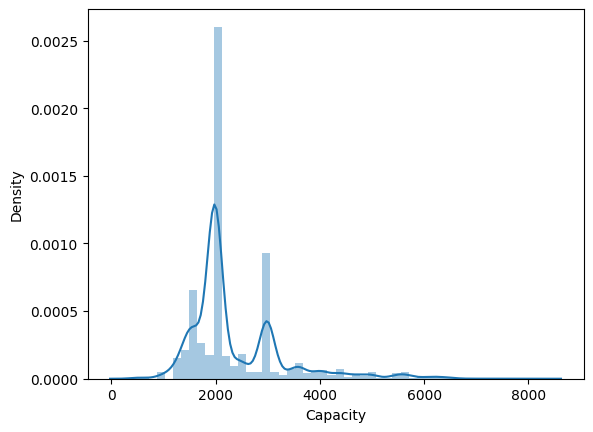

In [88]:
sns.distplot(s_man['Capacity']  )

In [15]:
s_man.corr()

,Year,Mileage,Capacity,Price
Year,1.000000,-0.594103,-0.313704,0.402209
Mileage,-0.594103,1.000000,0.125967,-0.451174
Capacity,-0.313704,0.125967,1.000000,0.296429
Price,0.402209,-0.451174,0.296429,1.000000


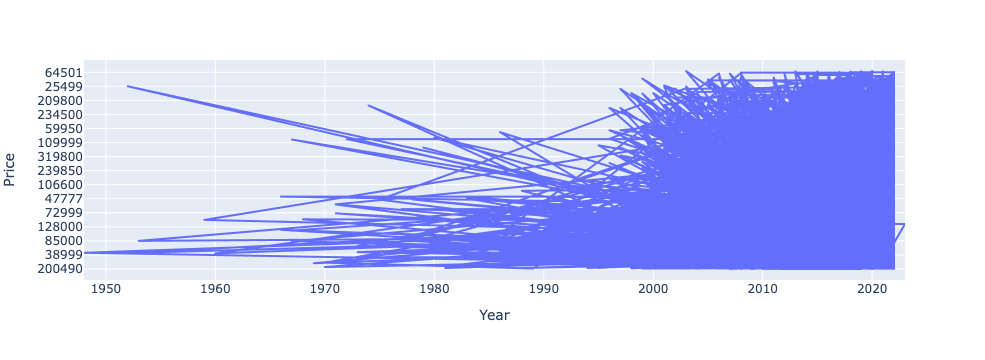

In [95]:
# https://python-charts.com/evolution/line-chart-plotly/ 
#create grup by for a numbers of cars eyach years

fig = px.line(s_man, x=s_man['Year'], y=s_man['Price'])

fig.show()

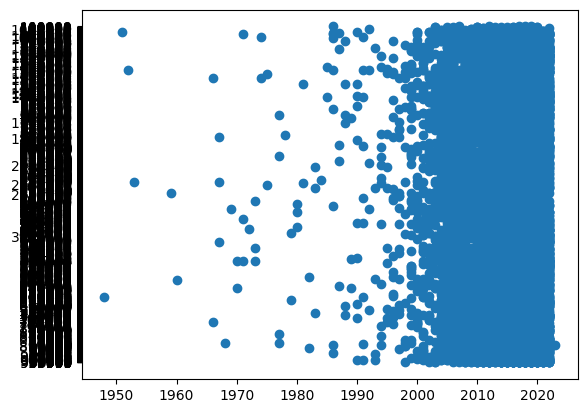

<Figure size 8000x8000 with 0 Axes>

In [96]:
plt.scatter(x=s_man['Year'], y=s_man['Price'].sort_values(ascending=False) )
plt.figure(figsize=(80,80))
plt.show()


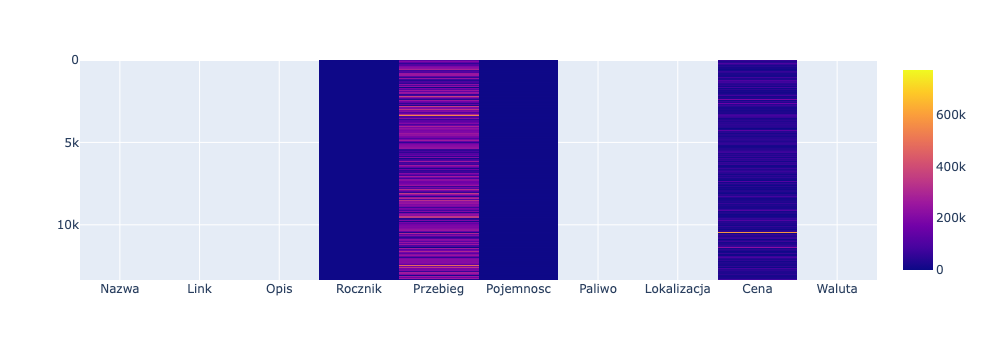

In [17]:
fig = px.imshow(s_aut)

fig.show()

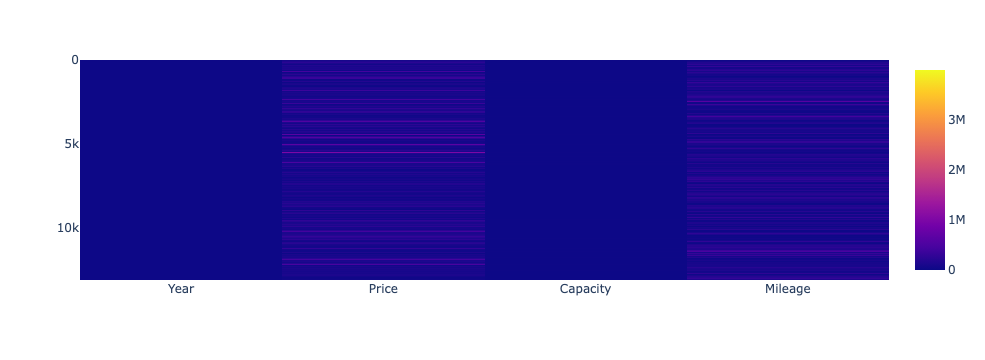

In [19]:
new = s_man[['Year','Price', 'Capacity', 'Mileage']]

fig = px.imshow(new)

fig.show()

NameError: name 's_man2000' is not defined

In [17]:
s_man2000 = s_man[s_man['Year']>=2000]
s_man2000 = s_man[s_man['Capacity'].between(1000,4000)]

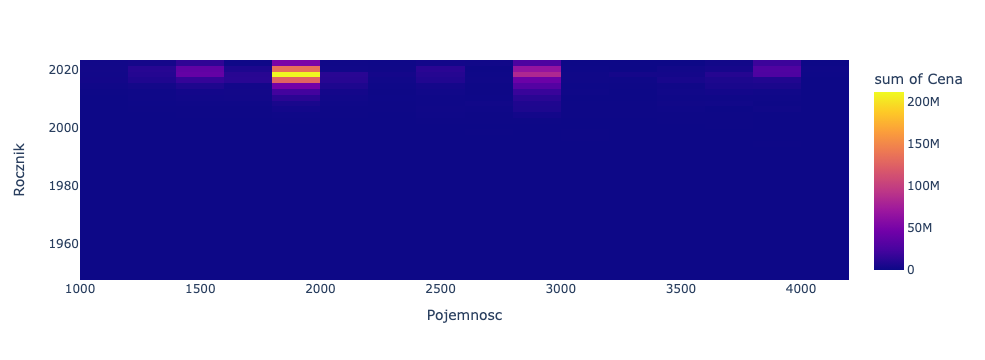

In [22]:
px.density_heatmap(s_man2000.sort_values(by='Capacity'), x='Capacity', y='Year' , z='Price')

In [23]:
p = s_man['Capacity'].sort_values(ascending=True)

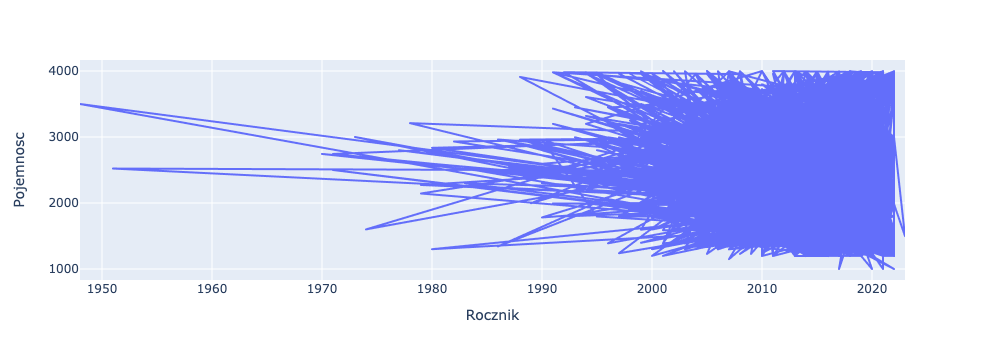

In [55]:
fig = px.line(s_man2000, x=s_man2000['Year'], y= 'Capacity')

fig.show()

In [16]:
plt.scatter(x=s_man2000['Year'], y=s_man2000['Capacity'] )
plt.figure(figsize=(80,80))
plt.show()

NameError: name 's_man2000' is not defined

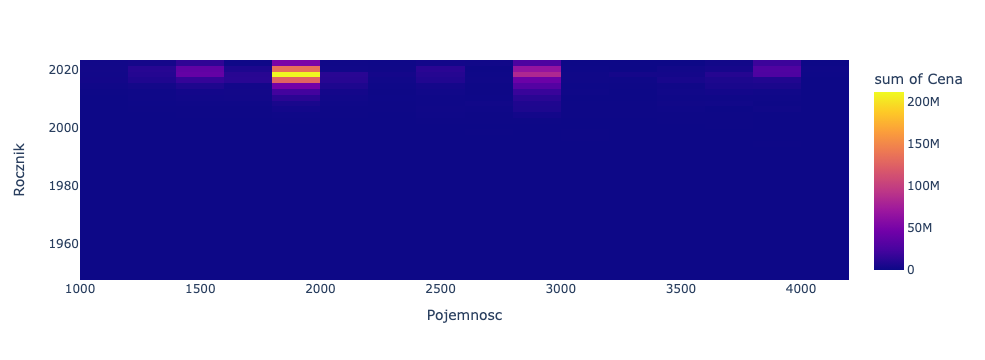

In [58]:
px.density_heatmap(s_man2000, x='Capacity', y='Year' , z='Price')

In [1]:
s_man2000 = s_man[s_man['Year']>=2000]
s_man2000 = s_man[s_man['Capacity'].between(1000,4000)]

NameError: name 's_man' is not defined

In [56]:
s_man2000.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11721 entries, 0 to 13075
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Nazwa        11721 non-null  object
 1   Link         11721 non-null  object
 2   Opis         11192 non-null  object
 3   Rocznik      11721 non-null  int64 
 4   Przebieg     11721 non-null  int64 
 5   Pojemnosc    11721 non-null  int64 
 6   Paliwo       11721 non-null  object
 7   Lokalizacja  11721 non-null  object
 8   Cena         11721 non-null  int64 
 9   Waluta       11721 non-null  object
dtypes: int64(4), object(6)
memory usage: 1007.3+ KB


In [14]:
#Wyswietl model i marke  w nowych kolumnach

In [42]:
s_man2000.head(2)

,Nazwa,Link,Opis,Rocznik,Przebieg,Pojemnosc,Paliwo,Lokalizacja,Cena,Waluta,Brand,Brand1
0,Mercedes-Benz GLC 220 d 4-Matic,https://www.otomoto.pl/oferta/mercedes-benz-gl...,Mercedes Benz GLC Pakiet AMG full opcja,2019,105000,1950,Diesel,Hajnówka (Podlaskie),200490,PLN,Mercedes-Benz,GLC
1,Jaguar XF 3.0 V6 D S Luxury,https://www.otomoto.pl/oferta/jaguar-xf-jaguar...,Jaguar XF S Premium Luxury PORTFOLIO 3.0 V6 27...,2010,280000,2993,Diesel,Bystrzyca (Lubelskie),48000,PLN,Jaguar,XF


In [37]:
s_man2000['Brand'] = s_man2000['Nazwa'].str.split(' ').str[0]
s_man2000['Model'] = s_man2000['Nazwa'].str.split(' ').str[1]


/Users/marcin/Applications/Link.app/Contents/Resources/mrx-link-venv/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/marcin/Applications/Link.app/Contents/Resources/mrx-link-venv/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:
s_man2000.drop(columns = ['Model'], inplace = True)

/Users/marcin/Applications/Link.app/Contents/Resources/mrx-link-venv/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

